This code implements a simulation of character activation in the Friends social network by using a custom propagation model for the specific context of the TV show: an Episodic Weighted Fractional Threshold Model. It builds episodic graphs from interactions in each episode and assigns weights to character relationships based on interaction frequency. Main characters in the show (Rachel, Ross, Chandler, Monica, Phoebe, Joey) have specific manually assigned thresholds based on their relationships with each other. For secondary and minor characters the threshold is assigned at an automatic 5 for simplicity, but fluctuates based on the dynamics of their interactions with other characters, especially the main group. Within the code we will assess different scenerios by changing the parameters, outbreak origins, and other measures to simulate realistic social situations. The results will include a list of activated characters, visualized as a color-coded graph as well as a markdown assessing the secondary character trends and overall results due to the changes made in the code. The model highlights how network science can simulate social dynamics, emphasizing the roles of decay, thresholds, and relationship strengths in influence propagation.

The adjustments made will help us visualize social situations more realistically in light of the fact that closer relationships tend to have lower thresholds. For example, siblings will be more likely to interact with each other than casual friends; and casual friends will be more likely to interact with each other than with strangers.

Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'Paul', 'LeonardGreen', 'Barry', 'Judy', 'Jack', 'Mindy', 'Carol', 'Susan', 'Alan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'funBobby', 'David', 'NoraBing', 'Roger', 'MrTribbiani', 'Ronni', 'Charlie', 'Ursula', 'LuisaGianetti', 'Danielle', 'nurse', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'waiter_2_5', 'FrankJr', 'Gunther', 'Estelle', 'Russ', 'Erika', 'Erica', 'Richard', 'Eddie', 'Mark', 'Robert', 'Chloe', 'Sophie', 'Pete', 'Alice', 'Joanna', 'chick', 'duck', 'Tommy', 'director_3_22', 'Tim', 'Tomas', 'Doug', 'Bonnie', 'Kathy', 'DrTimothyBurke', 'Joshua', 'Emily', 'AndreaWaltham', 'registrar', 'StevenWaltham', 'FrankJrJr', 'LeslieBuffay', 'ChandlerBuffay', 'Danny', 'Tom', 'RevBong', 'Gary', 'MrZelner', 'grandmaTribbiani', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'fireman1', 'PaulStevens', 'Tag', 'HelenaHandbasket', 'Mona', 'frontDeskClerk', 'DrLong', 'Will', 'Parker', 'interviewer', 'Emma', 'Mike', 'Theodore',

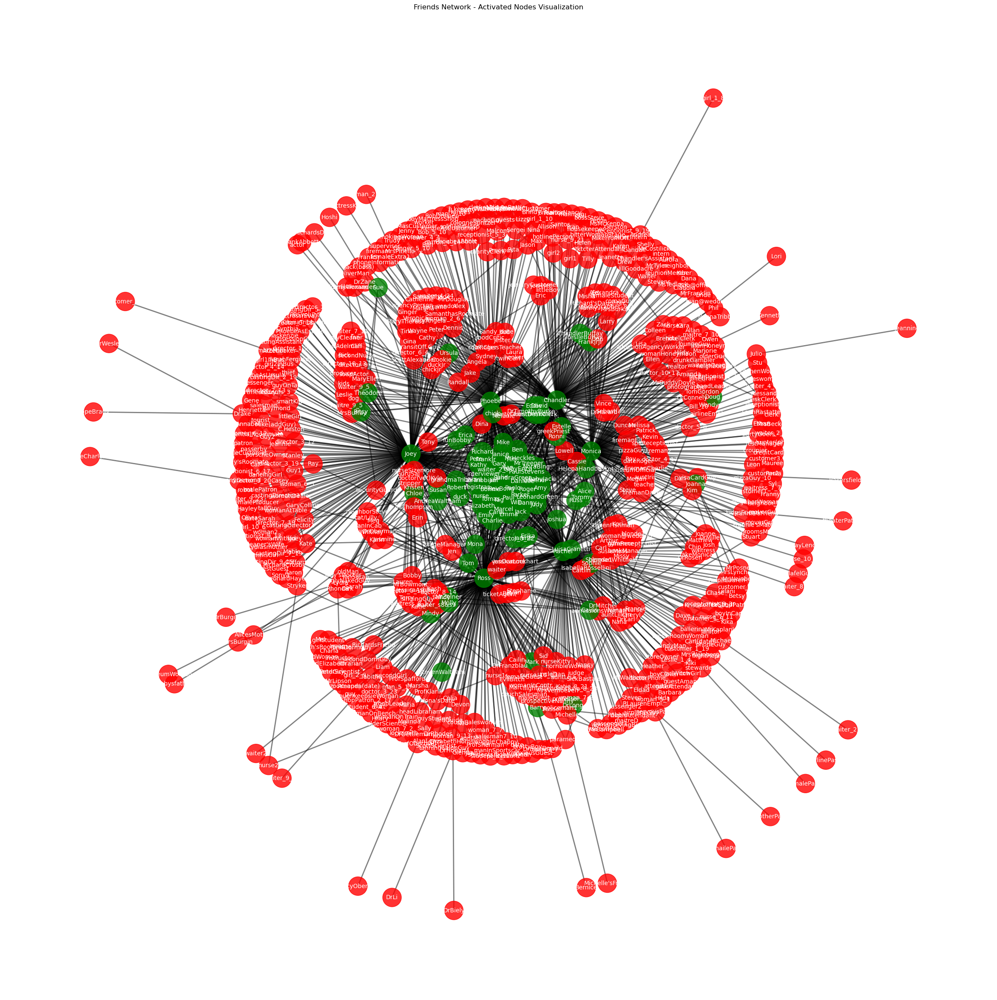

In [ ]:
#INITIAL PARAMETERS: DECAY AT 1, THRESHOLD AT 5, initial activators: all main characters
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict


# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph)  # the keys are episode names like s1e1
    current_episode = None  # we store a graph for each episode in the dictionary
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"):  # new episodes start with #
                current_episode = line.strip()  # for example: "# s1e1"
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2:  # an edge (interaction) is created in between two characters
                    G_episodic[current_episode].add_edge(*edge)  # the edge is added to the graph of the episode
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float))  # dictionary to keep weights
    for episode, graph in G_episodic.items():  # for graphs of each episode
        for u, v in graph.edges:  # for every interaction in the episode
            weights[u][v] += 1  # increment the weight for each interaction
            weights[v][u] += 1  # ensures weight is symmetric (our graph is undirected)
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=1): #choosing 0.9 as decay for now, will assess different scenerios later
    for u in weights:  # for all characters "u" in the weights dict
        for v in weights[u]:  # for all the other participants in the interaction
            weights[u][v] *= decay_factor  # reduces influence of interaction with time
    return weights

def initialize_thresholds(weights):
    thresholds = defaultdict(lambda: 5)  # Default threshold of 5 for all nodes
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,  # Romantic relationship (fluctuating), lower threshold. These characters have an on again off again relationship that stabilizes later in the show. 
        ("Monica", "Chandler"): 2,  # Romantic relationship, lower threshold
        ("Monica", "Ross"): 3,  # Sibling relationship, moderate threshold
        ("Joey", "Chandler"): 4,  # Roommates, moderate threshold
        ("Phoebe", "Joey"): 5,  # Friendship, higher threshold
        ("Monica", "Phoebe"): 5,  # Friendship, higher threshold
        ("Phoebe", "Rachel"): 4,  # Roommates, moderate threshold
    }
    
    # Applying the relationship thresholds
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value  # applies the relationship threshold to both characters for symmetry
        thresholds[v] = threshold_value

    # For secondary characters, calculating the thresholds based on # of interactions
    for node in weights:
        if node not in thresholds:  # if the character isn't a main character
            # Calculate threshold based on interactions 
            num_interactions = sum(weights[node].values())  # Sum of interactions with others
            # Ensure the threshold is at least 10
            if num_interactions < 10: # we will experiment with this later
                thresholds[node] = 5  # For very few interactions, apply a minimum threshold of 10
            else:
                thresholds[node] = max(5, num_interactions // 2)  # Cap the max threshold to 20

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}  # All nodes start inactive
    initial_adopters = ["Rachel", "Ross","Phoebe","Joey","Chandler","Monica"]  # Characters who will start the activation
    for adopter in initial_adopters:
        activated[adopter] = True  # Rachel and Ross are activated (we will see different scenerios later)

    for _ in range(steps):  # loop over number of steps
        new_activated = activated.copy()  # we create new_activated so the current step doesn't overwrite the previous one
        for episode, graph in G_episodic.items():  # loop through each episode's graph
            for node in graph.nodes:
                if not activated[node]:  # if the character isn't activated already
                    neighbors = graph.neighbors(node)  # look at the interactions it has
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    )  # the strength of interaction * active/inactive status for current node activation
                    threshold_value = threshold[node]  # activation threshold for current node (min needed influence to get activated)
                    if influence >= threshold_value:  # if influence justifies the threshold, activate the current character. 
                        new_activated[node] = True
        weights = decay_weights(weights)  # reduce influence of older interactions over time
        if new_activated == activated:  # If no new activations, stop
            break
        activated = new_activated  # If it became activated, return final activated characters
    return activated


# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds(weights)  # Pass the weights to initialize thresholds dynamically
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()

# Adding nodes and edges based on the episodic graph
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

# Setting node colors: activated nodes will be green, others will be red
node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]

# Step 7: Plotting the graph
plt.figure(figsize=(30, 30))  # adjusting the figure size for better readability and clear view of the activated core group
pos = nx.kamada_kawai_layout(G)  # Layout for better visualization
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

# Showing the plot
plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')  # Hide the axes
plt.show()


'''  
Activated Secondary characters:
'Paul', 'LeonardGreen', 'Barry', 'Judy', 'Jack', 'Mindy', 'Carol', 'Susan', 'Alan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'funBobby', 'David', 'NoraBing', 'Roger', 'MrTribbiani', 'Ronni', 'Charlie', 'Ursula', 'LuisaGianetti', 'Danielle', 'nurse', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'waiter_2_5', 'FrankJr', 'Gunther', 'Estelle', 'Russ', 'Erika', 'Erica', 'Richard', 'Eddie', 'Mark', 'Robert', 'Chloe', 'Sophie', 'Pete', 'Alice', 'Joanna', 'chick', 'duck', 'Tommy', 'director_3_22', 'Tim', 'Tomas', 'Doug', 'Bonnie', 'Kathy', 'DrTimothyBurke', 'Joshua', 'Emily', 'AndreaWaltham', 'registrar', 'StevenWaltham', 'FrankJrJr', 'LeslieBuffay', 'ChandlerBuffay', 'Danny', 'Tom', 'RevBong', 'Gary', 'MrZelner', 'grandmaTribbiani', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'fireman1', 'PaulStevens', 'Tag', 'HelenaHandbasket', 'Mona', 'frontDeskClerk', 'DrLong', 'Will', 'Parker', 'interviewer', 'Emma', 'Mike', 'Theodore', 'Bitsy', 'Sue', 'Gavin', 'Molly', 'babyErica', 'babyJack'
-----------------------------------------------
Immediate Family Members
Judy Geller: Ross and Monica's mother.
Jack Geller: Ross and Monica's father.
Leonard Green: Rachel’s father.
Sandra Green: Rachel’s mother.
-------------------------------
Romantic Relationships
Paul the Wine Guy: Monica's date from the pilot episode.
Barry Farber: Rachel's ex-fiancé.
Mindy: Rachel’s ex-best friend and maid of honor.
Carol Willick: Ross's ex-wife.
Susan Bunch: Carol’s wife.
Janice Litman-Goralnik: Chandler’s recurring ex-girlfriend."
Paolo: Rachel’s ex-boyfriend.
Emily Waltham: Ross's second wife.
Kathy: Joey’s and Chandler's ex-girlfriend.
Richard Burke: Monica's older ex-boyfriend.
Bonnie: Phoebe's friend and Ross' ex-girlfriend. 
Joshua Burgin: Rachel’s ex-boyfriend.
Tag Jones: Rachel’s ex-boyfriend.
Charlie Wheeler: Joey and Ross' ex-girlfriend.
Elizabeth Stevens: Ross's ex-girlfriend.
----------------------------------------------------
This number of minor characters are the most we will allow in this demonstration in consideration of the length of the output. 
This vast amount of minor and secondary characters being activated is caused by 3 main parameters: All the main characters being involved in the initial activation, the threshold being too low, and the decay being 1; which means the influence of interactions will not reduce over time. We will change these parameters in the later examples. 
'''


Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'LeonardGreen', 'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'David', 'NoraBing', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'FrankJr', 'Gunther', 'Estelle', 'Erica', 'Richard', 'Pete', 'Alice', 'chick', 'duck', 'Bonnie', 'Kathy', 'Joshua', 'Emily', 'AndreaWaltham', 'registrar', 'StevenWaltham', 'Danny', 'Gary', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'PaulStevens', 'Tag', 'HelenaHandbasket', 'Mona', 'Emma', 'Mike']


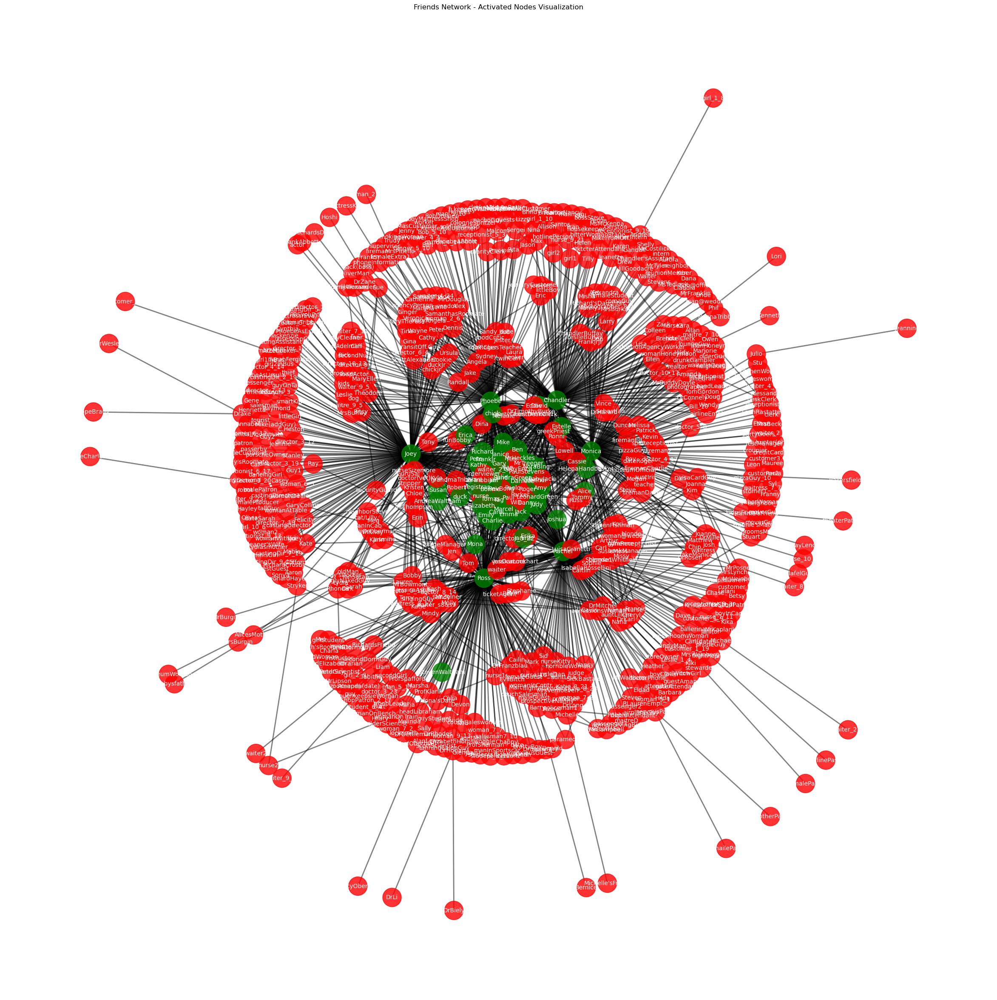

In [ ]:
# DIFFERENT PARAMETERS: THRESHOLDS: 10,  activators: Ross, Rachel  (comments have been minimized for simplicity of comparison)
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph) 
    current_episode = None 
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"): 
                current_episode = line.strip()  
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2: 
                    G_episodic[current_episode].add_edge(*edge) 
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float)) 
    for episode, graph in G_episodic.items(): 
        for u, v in graph.edges: 
            weights[u][v] += 1  
            weights[v][u] += 1 
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=1): 
    for u in weights:
        for v in weights[u]:
            weights[u][v] *= decay_factor
    return weights

def initialize_thresholds():
    thresholds = defaultdict(lambda: 5)  
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,
        ("Monica", "Chandler"): 2,
        ("Monica", "Ross"): 3,
        ("Joey", "Chandler"): 4,
        ("Phoebe", "Joey"): 5,
        ("Monica", "Phoebe"): 5,
        ("Phoebe", "Rachel"): 4,
    }
    
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value
        thresholds[v] = threshold_value
    
    for node in weights:
        if node not in thresholds:
            num_interactions = sum(weights[node].values())
            if num_interactions < 10:
                thresholds[node] = 10  # Increased minimum threshold to 20 to eliminate minor characters !
            else:
                thresholds[node] = max(10, num_interactions // 2)

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}
    initial_adopters = ["Rachel", "Ross"]         #same characters
    for adopter in initial_adopters:
        activated[adopter] = True

    for _ in range(steps):
        new_activated = activated.copy()
        for episode, graph in G_episodic.items():
            for node in graph.nodes:
                if not activated[node]:
                    neighbors = graph.neighbors(node)
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    )
                    threshold_value = threshold[node]
                    if influence >= threshold_value:
                        new_activated[node] = True
        weights = decay_weights(weights)
        if new_activated == activated:
            break
        activated = new_activated
    return activated

# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds()
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]
plt.figure(figsize=(30, 30)) 
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')
plt.show()



Output analysis: 
The rest of the main group (Joey, Monica, Chandler, Phoebe) get activated almost immediately because Ross and Rachel are the initial activators.
Secondary characters get activated: 
SandraGreen, LeonardGreen, Judy, Jack, Carol, Susan: These are the parents and relatives of the main characters.
Janice, MrHeckles, Paolo, Marcel, Charlie, Ben, Julie: These are recurring secondary characters who interact with the main characters frequently.
Gunther, Richard, Pete, Alice, chick, duck, Kathy, Emily, Gary, Janine, Jill, Amy, Elizabeth, PaulStevens, Tag, Mona, Emma, Mike: These are also characters who were significant in certain plot points, showing that their interactions with the main cast were strong enough to reach their thresholds.

Secondary characters who passed the threshold of 10 with decay 1:

LeonardGreen', 'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'David', 'NoraBing', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'FrankJr', 'Gunther', 'Estelle', 'Erica', 'Richard', 'Pete', 'Alice', 'chick', 'duck', 'Bonnie', 'Kathy', 'Joshua', 'Emily', 'AndreaWaltham', 'registrar', 'StevenWaltham', 'Danny', 'Gary', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'PaulStevens', 'Tag', 'HelenaHandbasket', 'Mona', 'Emma', 'Mike'

The decrease in secondary characters is because of the higher threshold and lower initial activators. 

Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'LeonardGreen', 'Jack', 'Janice', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'Gunther', 'duck', 'Emily', 'Gary', 'Janine', 'PaulStevens', 'Tag', 'Mona', 'Emma', 'Mike']


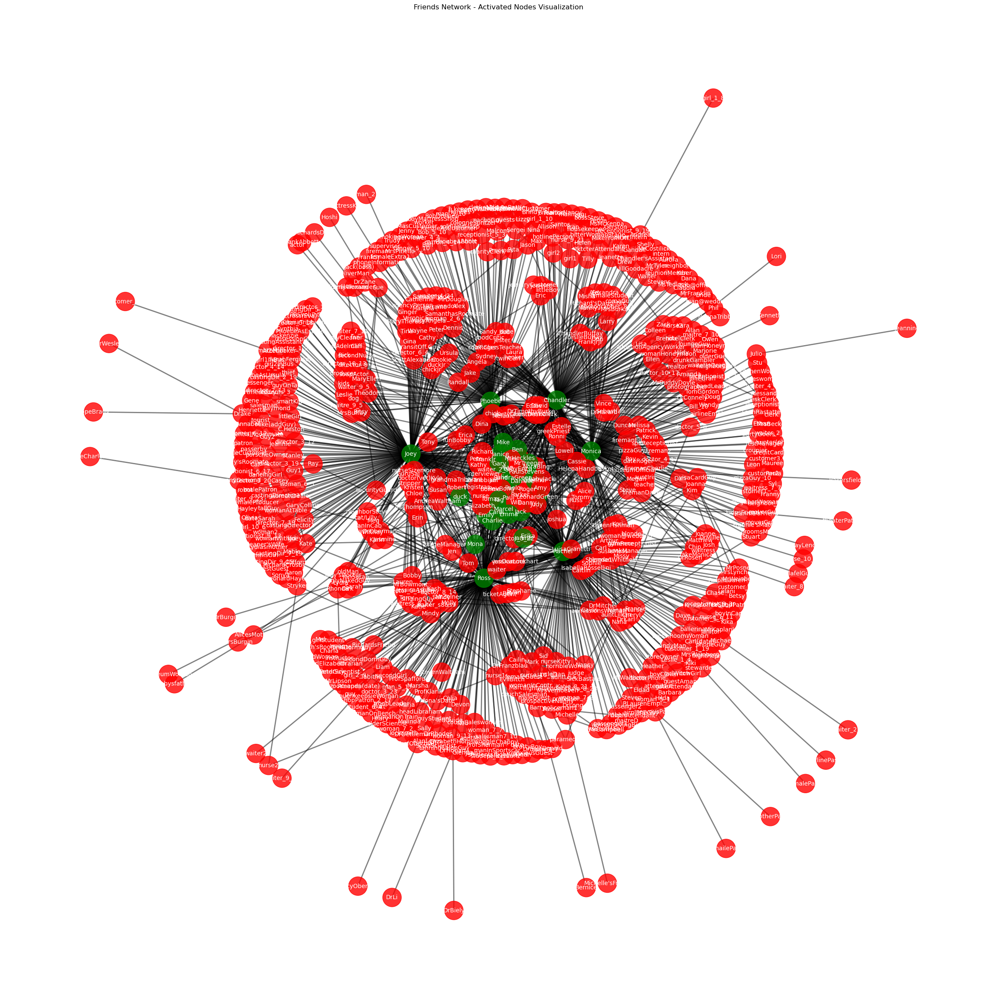

In [12]:
# DIFFERENT PARAMETERS: THRESHOLDS: 10, DECAY: 0.7
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph) 
    current_episode = None 
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"): 
                current_episode = line.strip()  
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2: 
                    G_episodic[current_episode].add_edge(*edge) 
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float)) 
    for episode, graph in G_episodic.items(): 
        for u, v in graph.edges: 
            weights[u][v] += 1  
            weights[v][u] += 1 
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=0.7):  # New decay factor of 0.7!
    for u in weights:
        for v in weights[u]:
            weights[u][v] *= decay_factor
    return weights

def initialize_thresholds():
    thresholds = defaultdict(lambda: 5)  
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,
        ("Monica", "Chandler"): 2,
        ("Monica", "Ross"): 3,
        ("Joey", "Chandler"): 4,
        ("Phoebe", "Joey"): 5,
        ("Monica", "Phoebe"): 5,
        ("Phoebe", "Rachel"): 4,
    }
    
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value
        thresholds[v] = threshold_value
    
    for node in weights:
        if node not in thresholds:
            num_interactions = sum(weights[node].values())
            if num_interactions < 10:
                thresholds[node] = 10  # Threshold value at 20 to eliminate minor characters once again
            else:
                thresholds[node] = max(10, num_interactions // 2)

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}
    initial_adopters = ["Rachel", "Ross"]               #same characters
    for adopter in initial_adopters:
        activated[adopter] = True

    for _ in range(steps):
        new_activated = activated.copy()
        for episode, graph in G_episodic.items():
            for node in graph.nodes:
                if not activated[node]:
                    neighbors = graph.neighbors(node)
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    )
                    threshold_value = threshold[node]
                    if influence >= threshold_value:
                        new_activated[node] = True
        weights = decay_weights(weights)
        if new_activated == activated:
            break
        activated = new_activated
    return activated

# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds()
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]
plt.figure(figsize=(30, 30)) 
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')
plt.show()

In this example we only changed one parameter compared to the previous example and that is decay. We set it at 0.7 this time. 
The main characters are activated.
The activated secondary characters are listed as:
'LeonardGreen', 'Jack', 'Janice', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'Gunther', 'duck', 'Emily', 'Gary', 'Janine', 'PaulStevens', 'Tag', 'Mona', 'Emma', 'Mike'.

This list has become much shorter due to the lower decay value. This means the influence of interactions will decay over time quickly than it would with a higher decay value. 

Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'LeonardGreen', 'Jack', 'Janice', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'Gunther', 'chick', 'duck', 'Emily', 'Gary', 'Janine', 'PaulStevens', 'Tag', 'Emma', 'Mike']


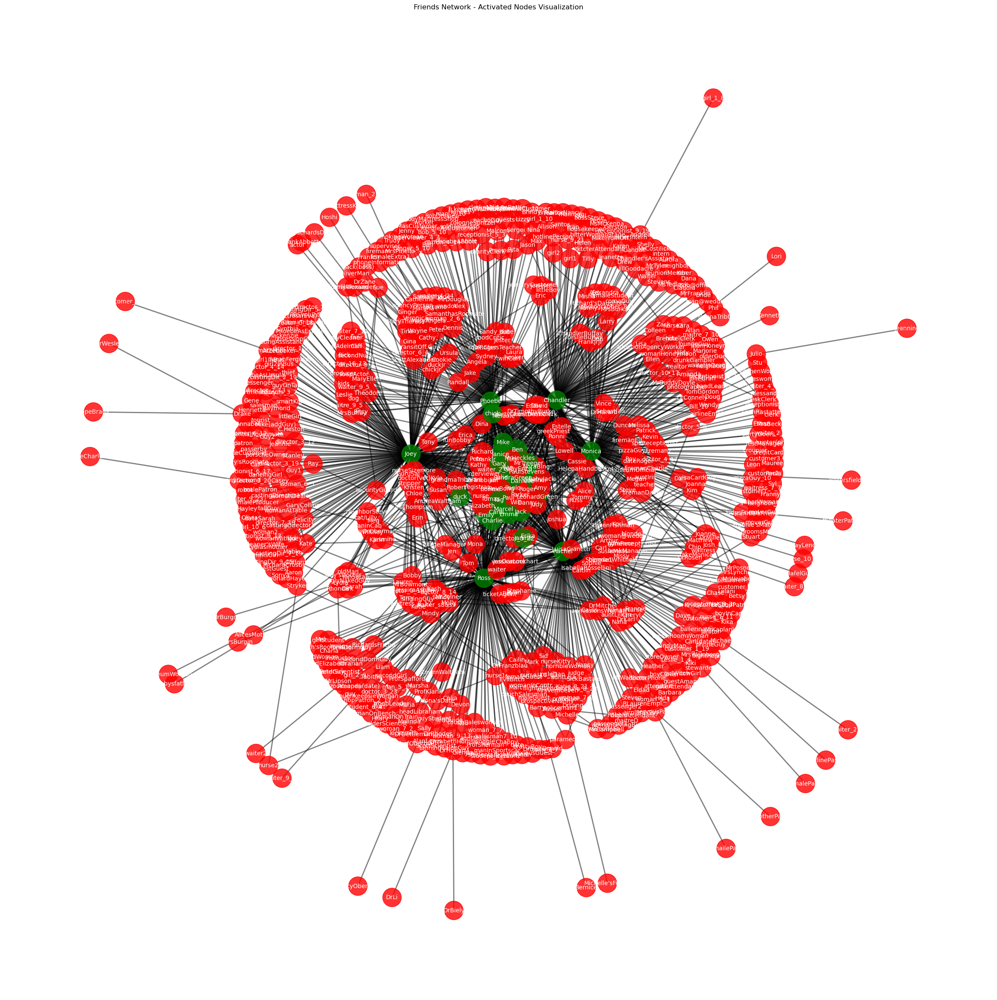

In [ ]:
# DIFFERENT PARAMETERS: INITIAL ACTIVATOR: JOEY, CHANDLER
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph)
    current_episode = None
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"):
                current_episode = line.strip() 
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2:
                    G_episodic[current_episode].add_edge(*edge)
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float)) 
    for episode, graph in G_episodic.items(): 
        for u, v in graph.edges: 
            weights[u][v] += 1  
            weights[v][u] += 1 
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=0.7):   #decay at 0.7 
    for u in weights:
        for v in weights[u]:
            weights[u][v] *= decay_factor
    return weights

def initialize_thresholds():
    thresholds = defaultdict(lambda: 5) 
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,
        ("Monica", "Chandler"): 2,
        ("Monica", "Ross"): 3,
        ("Joey", "Chandler"): 4,
        ("Phoebe", "Joey"): 5,
        ("Monica", "Phoebe"): 5,
        ("Phoebe", "Rachel"): 4,
    }
    
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value
        thresholds[v] = threshold_value
    
    for node in weights:
        if node not in thresholds:
            num_interactions = sum(weights[node].values())
            if num_interactions < 10:    
                thresholds[node] = 10     #threshold at 10 
            else:
                thresholds[node] = max(10, num_interactions // 2)

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}
    initial_adopters = ["Joey", "Chandler"]       # Changed initial adopters !!
    for adopter in initial_adopters:
        activated[adopter] = True

    for _ in range(steps):
        new_activated = activated.copy()
        for episode, graph in G_episodic.items():
            for node in graph.nodes:
                if not activated[node]:
                    neighbors = graph.neighbors(node)
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    )
                    threshold_value = threshold[node]
                    if influence >= threshold_value:
                        new_activated[node] = True
        weights = decay_weights(weights)
        if new_activated == activated:
            break
        activated = new_activated
    return activated

# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds()
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]
plt.figure(figsize=(30, 30)) 
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')
plt.show()


In this example, we have changed the initial activators to Joey and Chandler. Joey is the most central character in the show, as we have found earlier in our project. However the decay is still at 0.7, which will make it harder for minor characters to get activated. 
The main characters are activated. 
The list of activated secondary characters is as follows:
'LeonardGreen', 'Jack', 'Janice', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'Gunther', 'chick', 'duck', 'Emily', 'Gary', 'Janine', 'PaulStevens', 'Tag', 'Emma', 'Mike'

We see that the decay being low and the threshold being high has made it hard for new characters to emerge as we have predicted. 


Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'LeonardGreen', 'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'FrankJr', 'Gunther', 'Erica', 'Richard', 'Pete', 'Alice', 'chick', 'duck', 'Kathy', 'Emily', 'Gary', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'PaulStevens', 'Tag', 'Emma', 'Mike']


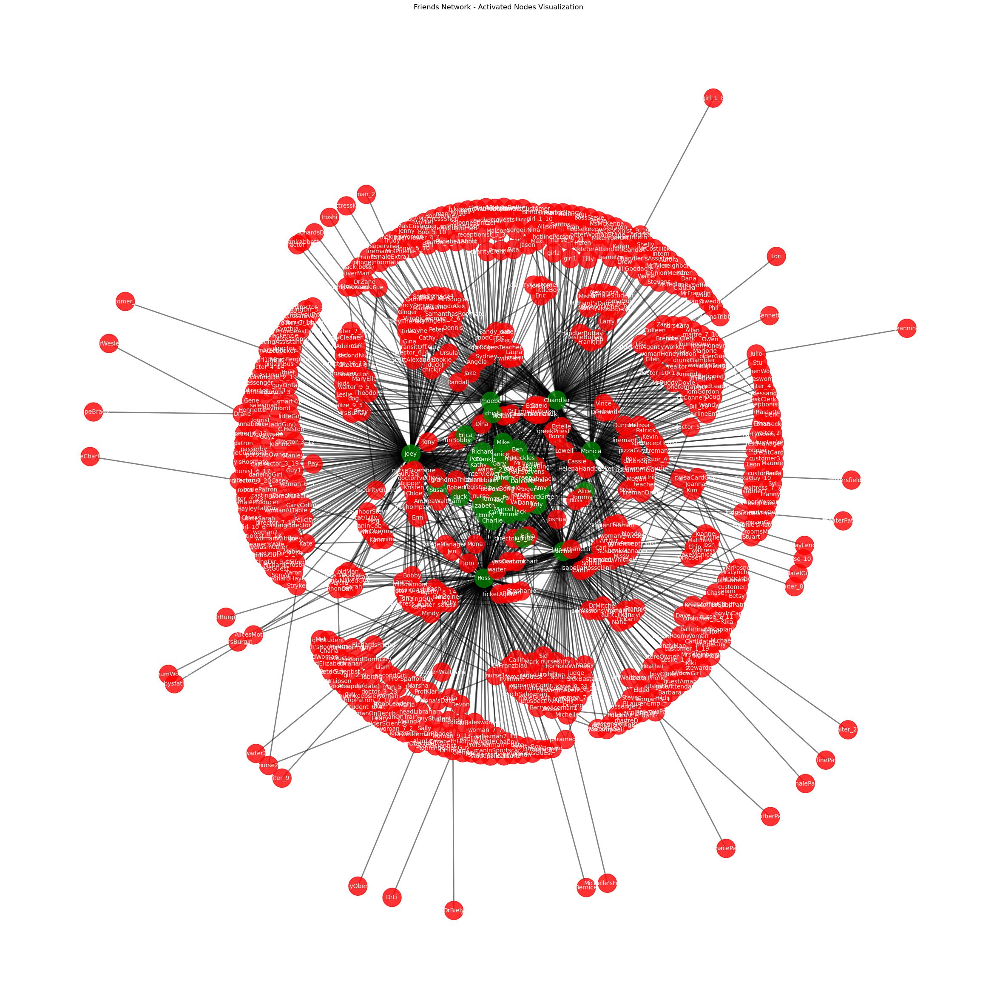

In [14]:
# DIFFERENT PARAMETER: DECAY: 0.9, INITIAL ACTIVATOR: JOEY, CHANDLER
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict

# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph)
    current_episode = None
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"):
                current_episode = line.strip() 
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2:
                    G_episodic[current_episode].add_edge(*edge)
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float)) 
    for episode, graph in G_episodic.items(): 
        for u, v in graph.edges: 
            weights[u][v] += 1  
            weights[v][u] += 1 
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=0.9):  #decay at 0.9
    for u in weights:
        for v in weights[u]:
            weights[u][v] *= decay_factor
    return weights

def initialize_thresholds():
    thresholds = defaultdict(lambda: 5) 
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,
        ("Monica", "Chandler"): 2,
        ("Monica", "Ross"): 3,
        ("Joey", "Chandler"): 4,
        ("Phoebe", "Joey"): 5,
        ("Monica", "Phoebe"): 5,
        ("Phoebe", "Rachel"): 4,
    }
    
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value
        thresholds[v] = threshold_value
    
    for node in weights:
        if node not in thresholds:
            num_interactions = sum(weights[node].values())
            if num_interactions < 10:
                thresholds[node] = 10    #same threshold as last time
            else:
                thresholds[node] = max(10, num_interactions // 2)

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}
    initial_adopters = ["Joey", "Chandler"]                  # Joey and Chandler are the initial activators 
    for adopter in initial_adopters:
        activated[adopter] = True

    for _ in range(steps):
        new_activated = activated.copy()
        for episode, graph in G_episodic.items():
            for node in graph.nodes:
                if not activated[node]:
                    neighbors = graph.neighbors(node)
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    )
                    threshold_value = threshold[node]
                    if influence >= threshold_value:
                        new_activated[node] = True
        weights = decay_weights(weights)
        if new_activated == activated:
            break
        activated = new_activated
    return activated

# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds()
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]
plt.figure(figsize=(30, 30)) 
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')
plt.show()


This time, we made the decay value higher, therefore the influence of interactions will last longer this time for us to compare the previous decay value to this new value. 
Let's see if Joey and Chandler did a better job of activating others this time.
The main characters are activated. 
Here are the secondary characters who were activated:
'LeonardGreen', 'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'MrHeckles', 'Paolo', 'Marcel', 'Charlie', 'Ben', 'Julie', 'MrTreeger', 'SandraGreen', 'FrankJr', 'Gunther', 'Erica', 'Richard', 'Pete', 'Alice', 'chick', 'duck', 'Kathy', 'Emily', 'Gary', 'Janine', 'Jill', 'Amy', 'Elizabeth', 'PaulStevens', 'Tag', 'Emma', 'Mike'

As we predicted, we have more secondary characters in the output due to the higher decay value. 

Activated Nodes: ['Monica', 'Joey', 'Chandler', 'Phoebe', 'Ross', 'Rachel', 'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'Charlie', 'Ben', 'Julie', 'FrankJr', 'Gunther', 'Emily', 'Emma', 'Mike']


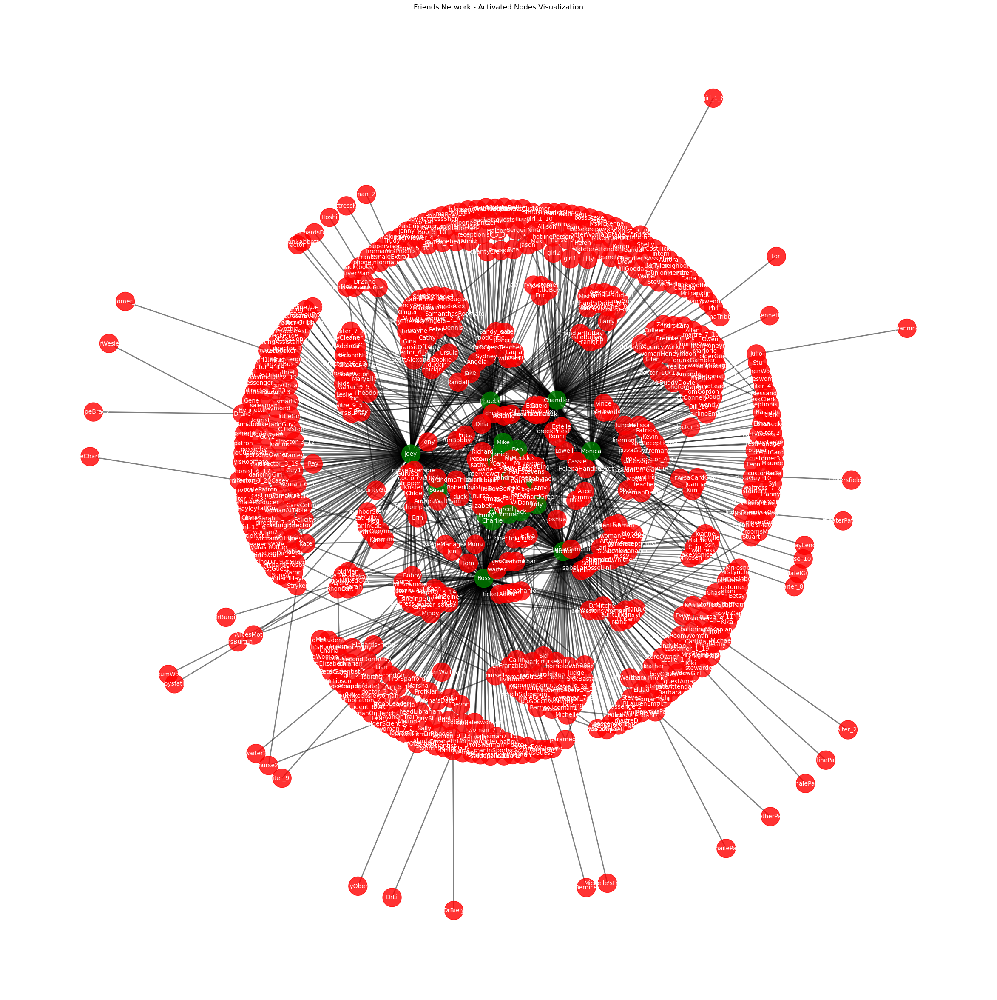

In [15]:
#INITIAL PARAMETERS: DECAY AT 0.9, THRESHOLD AT 20
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict


# Step 1: Creating an episodic graph
def build_episodic_graph(file_path):
    G_episodic = defaultdict(nx.Graph)  
    current_episode = None  
    with open(file_path, "r") as file:
        for line in file:
            if line.startswith("#"): 
                current_episode = line.strip()  
            elif line.strip() and current_episode:
                edge = line.strip().split()
                if len(edge) == 2:  
                    G_episodic[current_episode].add_edge(*edge)  
    return G_episodic

# Step 2: Initializing weights for relationships
def initialize_weights(G_episodic):
    weights = defaultdict(lambda: defaultdict(float))  
    for episode, graph in G_episodic.items(): 
        for u, v in graph.edges:  
            weights[u][v] += 1 
            weights[v][u] += 1  
    return weights

# Step 3: Implementing episodic decay
def decay_weights(weights, decay_factor=0.9): # 0.9 as decay 
    for u in weights:  
        for v in weights[u]: 
            weights[u][v] *= decay_factor 
    return weights

def initialize_thresholds(weights):
    thresholds = defaultdict(lambda: 5)  # Default threshold of 5 for all nodes
    relationship_thresholds = {
        ("Ross", "Rachel"): 2.5,  # Romantic relationship (fluctuating), lower threshold. These characters have an on again off again relationship that stabilizes later in the show. 
        ("Monica", "Chandler"): 2,  # Romantic relationship, lower threshold
        ("Monica", "Ross"): 3,  # Sibling relationship, moderate threshold
        ("Joey", "Chandler"): 4,  # Roommates, moderate threshold
        ("Phoebe", "Joey"): 5,  # Friendship, higher threshold
        ("Monica", "Phoebe"): 5,  # Friendship, higher threshold
        ("Phoebe", "Rachel"): 4,  # Roommates, moderate threshold
    }
    
    # Applying the relationship thresholds
    for (u, v), threshold_value in relationship_thresholds.items():
        thresholds[u] = threshold_value  
        thresholds[v] = threshold_value


    for node in weights:
        if node not in thresholds: 
  
            num_interactions = sum(weights[node].values()) 

            if num_interactions < 10: 
                thresholds[node] = 20  #threshold of 20
            else:
                thresholds[node] = max(20, num_interactions // 2)  

    return thresholds

# Step 4: Episodic Weighted Fractional Threshold Model
def episodic_fractional_threshold_model(G_episodic, weights, threshold, steps=10):
    activated = {node: False for node in weights}  
    initial_adopters = ["Rachel", "Ross", "Phoebe"] #Rachel, Ross, and Phoebe as initial activators
    for adopter in initial_adopters:
        activated[adopter] = True  

    for _ in range(steps): 
        new_activated = activated.copy()
        for episode, graph in G_episodic.items():  
            for node in graph.nodes:
                if not activated[node]: 
                    neighbors = graph.neighbors(node)  
                    influence = sum(
                        weights[node][neighbor] * activated[neighbor] for neighbor in neighbors
                    ) 
                    threshold_value = threshold[node] 
                    if influence >= threshold_value: 
                        new_activated[node] = True
        weights = decay_weights(weights)  
        if new_activated == activated: 
            break
        activated = new_activated  
    return activated


# Step 5: Running the model
file_path = "/Users/ceylakaya/Desktop/friends_episodes.txt"
G_episodic = build_episodic_graph(file_path)
weights = initialize_weights(G_episodic)
threshold = initialize_thresholds(weights) 
final_activations = episodic_fractional_threshold_model(G_episodic, weights, threshold)
activated_nodes = [node for node, active in final_activations.items() if active]
print("Activated Nodes:", activated_nodes)

# Step 6: Implementing NetworkX graph for visualization
G = nx.Graph()

# Adding nodes and edges based on the episodic graph
for episode, graph in G_episodic.items():
    G.add_edges_from(graph.edges)

# Setting node colors: activated nodes will be green, others will be red
node_colors = ['green' if final_activations[node] else 'red' for node in G.nodes]

# Step 7: Plotting the graph
plt.figure(figsize=(30, 30)) 
pos = nx.kamada_kawai_layout(G)  
nx.draw_networkx_nodes(G, pos, node_size=1000, node_color=node_colors, alpha=0.8)
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='black')
nx.draw_networkx_labels(G, pos, font_size=10, font_color='white')

# Showing the plot
plt.title("Friends Network - Activated Nodes Visualization")
plt.axis('off')  # Hide the axes
plt.show()


Finally, we can choose to make threshold at 20 and decay stay at 0.9 to evaluate the high threshold's effect. 
The main characters are activated. 
The list of secondary characters will be:
'Judy', 'Jack', 'Carol', 'Susan', 'Janice', 'Charlie', 'Ben', 'Julie', 'FrankJr', 'Gunther', 'Emily', 'Emma', 'Mike'

The high threshold really limits activation for less frequent and less weighted interactions with secondary characters. 
